## Seg Model Evaluation

In [1]:
import os
os.chdir("/data/projects/punim2016/zexianh/BudjBimStoneWallSeg-SSL")

import yaml
import torch
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams['font.size'] = 24
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['savefig.bbox'] = 'tight'
plt.rcParams['figure.constrained_layout.use'] = True
plt.rcParams['savefig.dpi'] = 250
plt.rcParams['figure.dpi'] = 250
import seaborn as sns
sns.set_style("whitegrid", {'axes.grid' : False})

from torch.utils.data import DataLoader, ConcatDataset
from data.dataset import BudjBimAreaDataset
from torchvision import transforms as T
from torchvision.transforms import functional as TF
from statistics import mean, stdev

from train.trainer import SiameseTrainer
from seg_utils import build_model
from model.segmentation import siamese_segmentation_model

display_names = {
    'random': 'Random',
    'supervised': 'Supervised',
    'dino': 'DINO',
    'dino_mc': 'DINO-MC',
    'dino_cv': 'DINO-CV'
}

/data/gpfs/projects/punim2016/anaconda3/envs/torch/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


/data/gpfs/projects/punim2016/anaconda3/envs/torch/lib/python3.9/site-packages/torch/nn/init.py:452: UserWarning: Initializing zero-element tensors is a no-op
  warnings.warn("Initializing zero-element tensors is a no-op")


Initialized model 'resnet50' with random weights.
Initialized model 'resnet50' with random weights.
Initialized model 'resnet50' with supervised weights (ImageNet1k).
Initialized model 'resnet50' with supervised weights (ImageNet1k).
Pretrained weights found at ./save/pretrained_weights/dino_resnet50_pretrain.pth and loaded with msg: _IncompatibleKeys(missing_keys=['fc.weight', 'fc.bias'], unexpected_keys=[])
Initialized model 'resnet50' with self-supervised pre-trained weights.
Pretrained weights found at ./save/pretrained_weights/dino_resnet50_pretrain.pth and loaded with msg: _IncompatibleKeys(missing_keys=['fc.weight', 'fc.bias'], unexpected_keys=[])
Initialized model 'resnet50' with self-supervised pre-trained weights.
Take key teacher in provided checkpoint dict
Pretrained weights found at ./save/pretrained_weights/dino_mc_resnet50.pth and loaded with msg: _IncompatibleKeys(missing_keys=['fc.weight', 'fc.bias'], unexpected_keys=['head.mlp.0.weight', 'head.mlp.0.bias', 'head.mlp.2

/tmp/ipykernel_10633/3502720327.py:116: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(right=0.90)
/tmp/ipykernel_10633/3502720327.py:118: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
/data/gpfs/projects/punim2016/anaconda3/envs/torch/lib/python3.9/site-packages/torch/nn/init.py:452: UserWarning: Initializing zero-element tensors is a no-op
  warnings.warn("Initializing zero-element tensors is a no-op")


Initialized model 'wide_resnet50_2' with random weights.
Initialized model 'wide_resnet50_2' with random weights.
Initialized model 'wide_resnet50_2' with supervised weights (ImageNet1k).
Initialized model 'wide_resnet50_2' with supervised weights (ImageNet1k).
Take key teacher in provided checkpoint dict
Pretrained weights found at ./save/pretrained_weights/dino_mc_wide_resnet50.pth and loaded with msg: _IncompatibleKeys(missing_keys=['fc.weight', 'fc.bias'], unexpected_keys=['head.mlp.0.weight', 'head.mlp.0.bias', 'head.mlp.2.weight', 'head.mlp.2.bias', 'head.mlp.4.weight', 'head.mlp.4.bias', 'head.last_layer.weight_g', 'head.last_layer.weight_v'])
Initialized model 'wide_resnet50_2' with self-supervised pre-trained weights.
Take key teacher in provided checkpoint dict
Pretrained weights found at ./save/pretrained_weights/dino_mc_wide_resnet50.pth and loaded with msg: _IncompatibleKeys(missing_keys=['fc.weight', 'fc.bias'], unexpected_keys=['head.mlp.0.weight', 'head.mlp.0.bias', 'he

/tmp/ipykernel_10633/3502720327.py:116: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(right=0.90)
/tmp/ipykernel_10633/3502720327.py:118: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


Initialized model 'vit_small' with random weights.
Initialized model 'vit_small' with random weights.


/data/gpfs/projects/punim2016/anaconda3/envs/torch/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Initialized model 'vit_small' with supervised weights (ImageNet1k).
Initialized model 'vit_small' with supervised weights (ImageNet1k).
Pretrained weights found at ./save/pretrained_weights/dino_deitsmall16_pretrain.pth and loaded with msg: <All keys matched successfully>
Initialized model 'vit_small' with self-supervised pre-trained weights.
Pretrained weights found at ./save/pretrained_weights/dino_deitsmall16_pretrain.pth and loaded with msg: <All keys matched successfully>
Initialized model 'vit_small' with self-supervised pre-trained weights.
Take key teacher in provided checkpoint dict
Pretrained weights found at ./save/pretrained_weights/dino_mc_deitsmall8_pretrain.pth and loaded with msg: _IncompatibleKeys(missing_keys=[], unexpected_keys=['head.mlp.0.weight', 'head.mlp.0.bias', 'head.mlp.2.weight', 'head.mlp.2.bias', 'head.mlp.4.weight', 'head.mlp.4.bias', 'head.last_layer.weight_g', 'head.last_layer.weight_v'])
Initialized model 'vit_small' with self-supervised pre-trained we

/tmp/ipykernel_10633/3502720327.py:116: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(right=0.90)
/tmp/ipykernel_10633/3502720327.py:118: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


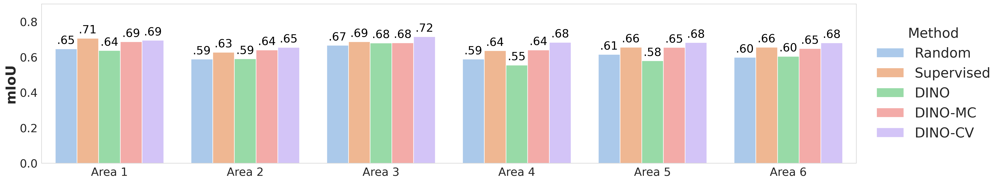

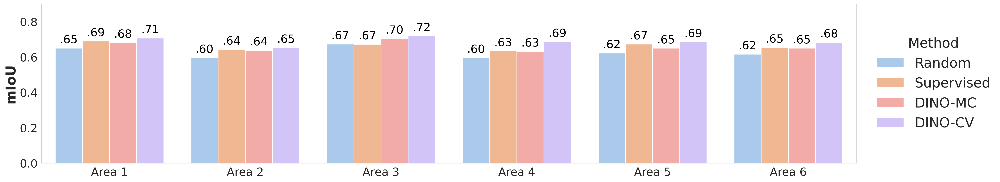

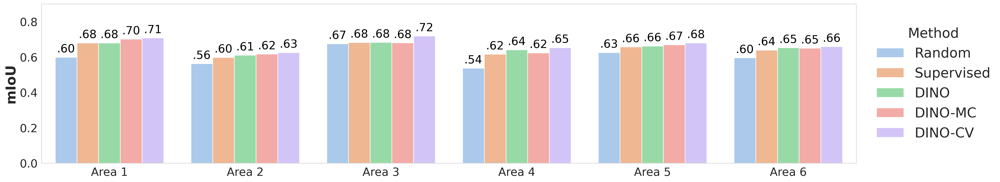

In [2]:
areas = ['area1', 'area2', 'area3', 'area4', 'area5', 'area6']
methods = ['random', 'supervised', 'dino', 'dino_mc', 'dino_cv']
backbones = ['rn50', 'wrn50', 'vitsmall16']

# Setup color palette
pastel_palette = sns.color_palette("pastel", len(methods))
pastel_colors = {display_names[methods[i]]: pastel_palette[i] for i in range(len(methods))}

# === Loop through backbones ===
for backbone in backbones:
    if backbone in ['rn50', 'vitsmall16']:
        methods = ['random', 'supervised', 'dino', 'dino_mc', 'dino_cv']
    elif backbone == 'wrn50':
        methods = ['random', 'supervised', 'dino_mc', 'dino_cv']

    # === Collect results ===
    results = []

    for area_id, area in enumerate(areas):
        for m in methods:
            if m == 'dino_cv':
                cfg_path = f'cfg/{m}_{backbone}_budjbim_siamese.yaml'
            elif m == 'dino_mc' and backbone == 'vitsmall16':
                cfg_path = 'cfg/dino_mc_vitsmall8_siamese.yaml'
            else:
                cfg_path = f'cfg/{m}_{backbone}_siamese.yaml'

            with open(cfg_path, 'r') as f:
                cfg = yaml.safe_load(f)

            trainer = SiameseTrainer(cfg=cfg)
            dataset = BudjBimAreaDataset(
                cfg['root'], 
                split='test', 
                test_area=area, 
                img_size=cfg['img_size'], 
                img_norm=cfg['img_norm']
            )
            dataset_loader = DataLoader(
                dataset,
                batch_size=cfg['batch'],
                shuffle=False,
                num_workers=cfg['num_workers'],
                drop_last=False,
                pin_memory=True
            )

            mhs_backbone = build_model(
                cfg['arch'], 
                cfg['weight_mode'], 
                cfg['mhs_encoder'], 
                cfg['img_size'], 
                cfg['patch_size']
            )
            vat_backbone = build_model(
                cfg['arch'], 
                cfg['weight_mode'], 
                cfg['vat_encoder'], 
                cfg['img_size'], 
                cfg['patch_size']
            )
            seg_model = siamese_segmentation_model(
                [mhs_backbone, vat_backbone], 
                cfg['feature_indices'], 
                cfg['feature_channels'], 
                cfg['patch_size'], 
                cfg['arch']
            )

            trainer.path = cfg['path'] + area
            seg_model = trainer.load_weights(seg_model, ckpt='best_val_epoch.pth')
            mcs = trainer.eval(seg_model, dataloader=dataset_loader, ckpt='best_val_epoch.pth')
            results.append({
                'Area': f'Area {area_id + 1}',
                'Method': display_names[m],
                'mIoU': mcs['mIoU']
            })

    # === Plotting ===
    df = pd.DataFrame.from_records(results)

    fig, ax = plt.subplots(figsize=(25, 5))
    sns.barplot(
        data=df,
        x="Area", y="mIoU", hue="Method",
        palette=pastel_colors, 
        ax=ax
    )

    for p in ax.patches:
        height = p.get_height()
        if pd.notna(height) and height > 0.0:
            ax.annotate(
                f'{height:.2f}'.lstrip('0'),
                (p.get_x() + p.get_width() / 2., height + 0.03),
                ha='center', va='center', 
                fontsize=20, color='black', 
                # rotation=30, rotation_mode='anchor',
                xytext=(0, 5), textcoords='offset points'
            )

    ax.set_ylim(0, 0.9)
    ax.set_xlabel("", fontsize=24, fontweight='bold')
    ax.set_ylabel("mIoU", fontsize=24, fontweight='bold')
    ax.tick_params(axis='both', labelsize=20)
    # Legend outside right
    ax.legend(
        title='Method',
        title_fontsize=24,
        fontsize=24,
        loc='center left',
        bbox_to_anchor=(1.01, 0.5),
        frameon=False
    )
    # Make space for the legend
    fig.subplots_adjust(right=0.90) 

    plt.tight_layout()
    plt.savefig(f"figs/{backbone}_miou_per_area.png", dpi=300)

## Predictions

Initialized model 'vit_small' with random weights.
Initialized model 'vit_small' with random weights.
Initialized model 'vit_small' with supervised weights (ImageNet1k).
Initialized model 'vit_small' with supervised weights (ImageNet1k).
Take key teacher in provided checkpoint dict
Pretrained weights found at ./save/pretrained_weights/dino_cv/vitsmall16_mhs_budjbim_pretrained/checkpoint.pth and loaded with msg: _IncompatibleKeys(missing_keys=[], unexpected_keys=['head.mlp.0.weight', 'head.mlp.0.bias', 'head.mlp.2.weight', 'head.mlp.2.bias', 'head.mlp.4.weight', 'head.mlp.4.bias', 'head.last_layer.weight_g', 'head.last_layer.weight_v'])
Initialized model 'vit_small' with self-supervised pre-trained weights.
Take key teacher in provided checkpoint dict
Pretrained weights found at ./save/pretrained_weights/dino_cv/vitsmall16_vat_budjbim_pretrained/checkpoint.pth and loaded with msg: _IncompatibleKeys(missing_keys=[], unexpected_keys=['head.mlp.0.weight', 'head.mlp.0.bias', 'head.mlp.2.wei

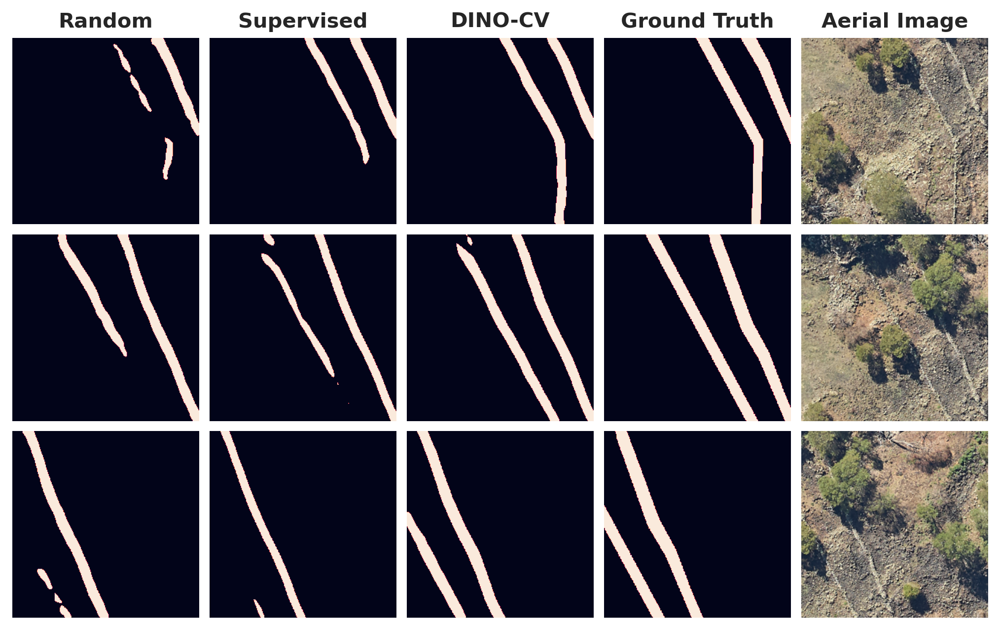

In [3]:
# area = 'area5'
# backbone = 'rn50'
# data_id =[1210, 1330, 1390]

# area = 'area4'
# backbone = 'wrn50'
# data_id = [232, 532, 932]

area = 'area1'
backbone = 'vitsmall16'
data_id = [10, 11, 20]

methods = ['random', 'supervised', 'dino_cv']

imgs = []
for idx in data_id:    
    for m in methods:
        if m == 'dino_cv':
            cfg = f'cfg/{m}_{backbone}_budjbim_siamese.yaml'
        else:
            cfg = f'cfg/{m}_{backbone}_siamese.yaml'
    
        with open(cfg, 'r') as f:
            cfg = yaml.safe_load(f) 
            cfg['path'] = cfg['path'] + area
        
        trainer = SiameseTrainer(cfg=cfg) 
        dataset = BudjBimAreaDataset(
            cfg['root'], 
            split='test', 
            test_area=area, 
            img_size=cfg['img_size'], 
            img_norm=False
        )
        
        mhs_backbone = build_model(
            cfg['arch'], 
            cfg['weight_mode'], 
            cfg['mhs_encoder'], 
            cfg['img_size'], 
            cfg['patch_size']
        )
        vat_backbone = build_model(
            cfg['arch'], 
            cfg['weight_mode'], 
            cfg['vat_encoder'], 
            cfg['img_size'], 
            cfg['patch_size']
        )
        seg_model = siamese_segmentation_model(
            [mhs_backbone, vat_backbone], 
            cfg['feature_indices'], 
            cfg['feature_channels'], 
            cfg['patch_size'], 
            cfg['arch']
        )
        seg_model = trainer.load_weights(seg_model, ckpt='best_val_epoch.pth')
    
        with torch.no_grad():
            inputs = [
                dataset[idx]['mhs'].unsqueeze(0).to(cfg['device']), 
                dataset[idx]['vat'].unsqueeze(0).to(cfg['device'])
            ]
            if m != 'random':
                inputs = [T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))(img) for img in inputs]
                
            pred = seg_model(inputs).sigmoid().squeeze(0)
    
        pred = TF.to_pil_image((pred > 0.5).float())
        imgs.append(pred)
    
    mask = dataset[idx]['mask']
    mask = TF.to_pil_image(mask)
    imgs.append(mask)
    
    rgb = dataset[idx]['rgb']
    rgb = TF.to_pil_image(rgb)
    imgs.append(rgb)


fig, axes = plt.subplots(nrows=len(data_id), ncols=len(methods)+2, figsize=(8, 5))
axes = axes.flatten()

for img_id, img in enumerate(imgs):
    axes[img_id].imshow(img)
    axes[img_id].axis('off')
    axes[img_id].set_aspect('equal')
    
    if img_id < 3:
        axes[img_id].set_title([display_names[m] for m in methods][img_id], fontsize=12, fontweight='bold')
        
    if img_id == 3:
        axes[img_id].set_title('Ground Truth', fontsize=12, fontweight='bold')

    if img_id == 4:
        axes[img_id].set_title('Aerial Image', fontsize=12, fontweight='bold')

plt.savefig(f"figs/{backbone}_preds.png", dpi=300)

## BudjBimArea Dataset

In [4]:
datasets = []
for area in ['area1', 'area2', 'area3', 'area4', 'area5', 'area6']:
    datasets.append(BudjBimAreaDataset(root='data/budjbim_area', split='test', test_area=area, img_size=256, img_norm=False))

dataset = ConcatDataset(datasets)

/tmp/ipykernel_58019/1379361836.py:29: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(left=0.15, wspace=0.05, hspace=0.05)


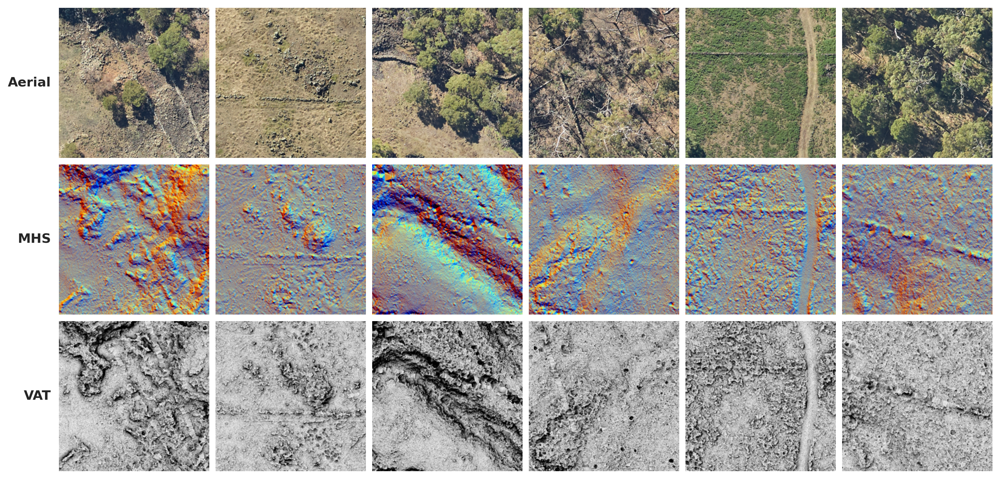

In [5]:
data_id = [11, 1301, 850, 4000, 5850, 7100]

mhs_imgs = []
vat_imgs = []
rgb_imgs = []

for idx in data_id:
    mhs_imgs.append(TF.to_pil_image(dataset[idx]['mhs']))
    vat_imgs.append(TF.to_pil_image(dataset[idx]['vat']))
    rgb_imgs.append(TF.to_pil_image(dataset[idx]['rgb']))

imgs = rgb_imgs + mhs_imgs + vat_imgs

fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(12, 6))
axes = axes.reshape(3, 6)

row_titles = ['Aerial', 'MHS', 'VAT']

for row_idx, (row_axes, title) in enumerate(zip(axes, row_titles)):
    for ax in row_axes:
        ax.imshow(imgs.pop(0))
        ax.axis('off')
        ax.set_aspect('equal')
    # Push title far to the left
    fig.text(-0.005, 1 - (row_idx + 0.5) / 3, title,
             va='center', ha='right', fontsize=12, fontweight='bold')

# Increase left margin to make more space
plt.subplots_adjust(left=0.15, wspace=0.05, hspace=0.05)
plt.savefig(f"figs/aerial_mhs_vat.png", dpi=300)

## Attention Map

In [6]:
import torch
import torch.nn as nn
import model.backbone.vision_transformer as vits

device = 'cuda'
data_view = 'vat'
pretrained_weights = f'save/pretrained_weights/dino_cv/vitsmall16_{data_view}_budjbim_pretrained/checkpoint.pth'
# pretrained_weights = 'save/pretrained_weights/dino_deitsmall16_pretrain.pth'

patch_size = 16
checkpoint_key = 'teacher'
model = vits.__dict__['vit_small'](patch_size=patch_size, num_classes=0)

for p in model.parameters():
    p.requires_grad = False
model.eval()
model.to(device)

if os.path.isfile(pretrained_weights):
    state_dict = torch.load(pretrained_weights, map_location="cpu")
    if checkpoint_key is not None and checkpoint_key in state_dict:
        print(f"Take key {checkpoint_key} in provided checkpoint dict")
        state_dict = state_dict[checkpoint_key]
    # remove `module.` prefix
    state_dict = {k.replace("module.", ""): v for k, v in state_dict.items()}
    # remove `backbone.` prefix induced by multicrop wrapper
    state_dict = {k.replace("backbone.", ""): v for k, v in state_dict.items()}
    msg = model.load_state_dict(state_dict, strict=False)
    print('Pretrained weights found at {} and loaded with msg: {}'.format(pretrained_weights, msg))

Take key teacher in provided checkpoint dict
Pretrained weights found at save/pretrained_weights/dino_cv/vitsmall16_vat_budjbim_pretrained/checkpoint.pth and loaded with msg: _IncompatibleKeys(missing_keys=[], unexpected_keys=['head.mlp.0.weight', 'head.mlp.0.bias', 'head.mlp.2.weight', 'head.mlp.2.bias', 'head.mlp.4.weight', 'head.mlp.4.bias', 'head.last_layer.weight_g', 'head.last_layer.weight_v'])


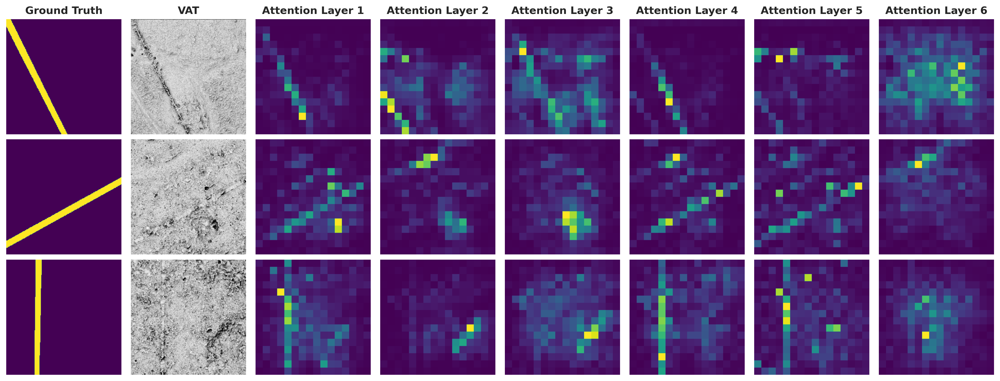

In [7]:
area = 'area5'
data_idx = [116, 630, 1450]
dataset = BudjBimAreaDataset('data/budjbim_area', split='test', test_area=area, img_norm=False)

imgs = []
for idx in data_idx:
    mask = dataset[idx]['mask']
    imgs.append(TF.to_pil_image(mask))
    
    img = dataset[idx][data_view]
    imgs.append(TF.to_pil_image(img))
    img = T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))(img)
    
    threshold = None

    # make the image divisible by the patch size
    w, h = img.shape[1] - img.shape[1] % patch_size, img.shape[2] - img.shape[2] % patch_size
    img = img[:, :w, :h].unsqueeze(0)

    w_featmap = img.shape[-2] // patch_size
    h_featmap = img.shape[-1] // patch_size

    attentions = model.get_last_selfattention(img.to(device))
    
    nh = attentions.shape[1] # number of head
    
    # we keep only the output patch attention
    attentions = attentions[0, :, 0, 1:].reshape(nh, -1)
    
    if threshold is not None:
        # we keep only a certain percentage of the mass
        val, idx = torch.sort(attentions)
        val /= torch.sum(val, dim=1, keepdim=True)
        cumval = torch.cumsum(val, dim=1)
        th_attn = cumval > (1 - threshold)
        idx2 = torch.argsort(idx)
        for head in range(nh):
            th_attn[head] = th_attn[head][idx2[head]]
        th_attn = th_attn.reshape(nh, w_featmap, h_featmap).float()
        # interpolate
        th_attn = nn.functional.interpolate(th_attn.unsqueeze(0), scale_factor=patch_size, mode="nearest")[0].cpu()
    
    attentions = attentions.reshape(nh, w_featmap, h_featmap)
    attentions = nn.functional.interpolate(attentions.unsqueeze(0), scale_factor=patch_size, mode="nearest")[0].cpu()
    
    if threshold is not None:
        atten_maps = [TF.to_pil_image((atten - atten.min()) / (atten.max() - atten.min())) for atten in th_attn]
    else:
        atten_maps = [TF.to_pil_image((atten - atten.min()) / (atten.max() - atten.min())) for atten in attentions]

    imgs += atten_maps

fig, axes = plt.subplots(nrows=len(data_idx), ncols=8, figsize=(16, 6))
axes = axes.flatten()

for idx, img in enumerate(imgs):
    axes[idx].imshow(img, cmap='viridis')
    axes[idx].axis('off')

    if idx == 0:
        axes[idx].set_title(f'Ground Truth', fontsize=12, fontweight='bold')

    if idx == 1:
        axes[idx].set_title(f'{data_view.upper()}', fontsize=12, fontweight='bold')

    if idx in [2, 3, 4, 5, 6, 7]:
        axes[idx].set_title(f'Attention Layer {idx-1}', fontsize=12, fontweight='bold')

plt.savefig(f"figs/dino_cv_{data_view}_atten_map.png", dpi=300)